### Importación de datos



In [ ]:
import pandas as pd

url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv"

tienda = pd.read_csv(url)
tienda2 = pd.read_csv(url2)
tienda3 = pd.read_csv(url3)
tienda4 = pd.read_csv(url4)

tienda.info()
tienda.tail()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2359 entries, 0 to 2358
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Producto                2359 non-null   object 
 1   Categoría del Producto  2359 non-null   object 
 2   Precio                  2359 non-null   float64
 3   Costo de envío          2359 non-null   float64
 4   Fecha de Compra         2359 non-null   object 
 5   Vendedor                2359 non-null   object 
 6   Lugar de Compra         2359 non-null   object 
 7   Calificación            2359 non-null   int64  
 8   Método de pago          2359 non-null   object 
 9   Cantidad de cuotas      2359 non-null   int64  
 10  lat                     2359 non-null   float64
 11  lon                     2359 non-null   float64
dtypes: float64(4), int64(2), object(6)
memory usage: 221.3+ KB


,Producto,Categoría del Producto,Precio,Costo de envío,Fecha de Compra,Vendedor,Lugar de Compra,Calificación,Método de pago,Cantidad de cuotas,lat,lon
2354,Iphone 15,Electrónicos,1284400.0,66600.0,15/11/2021,Izabela de León,Medellín,1,Nequi,1,6.25184,-75.56359
2355,Impresora,Electrónicos,282800.0,15300.0,18/03/2023,Lucas Olivera,Bogotá,5,Nequi,1,4.60971,-74.08175
2356,Juego de mesa,Juguetes,122900.0,7200.0,06/07/2021,Lucas Olivera,Cali,5,Tarjeta de crédito,4,3.43722,-76.52250
2357,Cama box,Muebles,691300.0,35000.0,02/05/2022,Pedro Gomez,Pasto,1,Tarjeta de crédito,2,1.21361,-77.28111
2358,Smartwatch,Electrónicos,195000.0,8600.0,18/06/2022,Felipe Santos,Cali,4,Tarjeta de crédito,1,3.43722,-76.52250


#1. Análisis de facturación



In [ ]:
!pip install pandas
import numpy as np
import pandas as pd
import statistics






In [ ]:
def facturacion_tienda(tienda,Precio,no_tienda):
  facturacion_por_tienda = sum(tienda["Precio"])

  print(f'la facturacion de la tienda {no_tienda} es:  $ {facturacion_por_tienda:,.0f} ')

facturacion_tienda(tienda,"precio",1)
facturacion_tienda(tienda2,"precio",2)
facturacion_tienda(tienda3,"precio",3)
facturacion_tienda(tienda4,"precio",4)


la facturacion de la tienda 1 es:  $ 1,150,880,400 
la facturacion de la tienda 2 es:  $ 1,116,343,500 
la facturacion de la tienda 3 es:  $ 1,098,019,600 
la facturacion de la tienda 4 es:  $ 1,038,375,700 


Todas las tiendas tienen montos de facturacion similares. Todas las tiendas tienen la misma cantidad de ventas

# GRAFICO FACTURACION TOTAL POR TIENDA

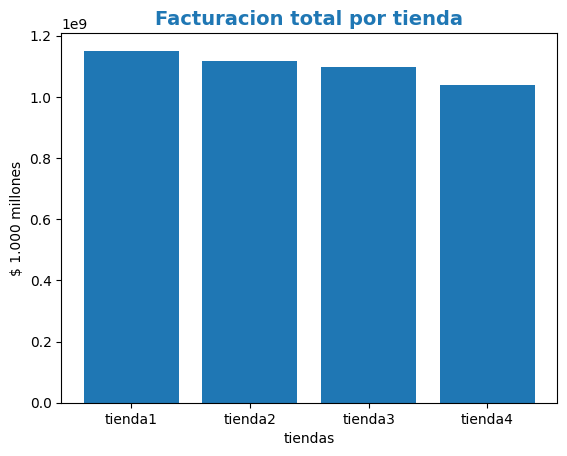

In [ ]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots()
ax.bar(["tienda1", "tienda2", "tienda3", "tienda4"], [ 1150880400, 1116343500, 1098019600, 1038375700])
ax.set_xlabel('tiendas')
ax.set_ylabel('$ 1.000 millones')
ax.set_title('Facturacion total por tienda', loc = "center", fontdict = {'fontsize':14, 'fontweight':'bold', 'color':'tab:blue'})
plt.show()

# 2. Ventas por categoría

In [ ]:
def ventas_categoria_por_tienda (tienda, precio, categoria,no_tienda):
  columna_categorias = tienda["Categoría del Producto"]
  lista_categorias = list(columna_categorias)

  # print(lista_categorias)
  columna_precios = tienda["Precio"]
  lista_precios = list(columna_precios)
  # print(lista_precios)

  categorias_precio =[(lista_categorias[i], lista_precios[i]) for i in range(len(lista_categorias))]
  # print(categorias_precio)

  categorias_unicos = list(set([tupla[0] for tupla in categorias_precio]))
  # print(categorias_unicos)

  lista_de_listas = []
  for categoria in categorias_unicos:
    lista = [tupla[1] for tupla in categorias_precio if tupla[0] == categoria]
    lista_de_listas.append(lista)

  agrupamiento_por_categoria = {categorias_unicos[i]: lista_de_listas[i] for i in range(len(categorias_unicos))}

  suma_por_categoria = {categorias_unicos[i]: sum(lista_de_listas[i]) for i in range(len(categorias_unicos))}

  print('')
  print(f'las ventas por categoria de la tienda {no_tienda} es:')
  for categoria, suma in suma_por_categoria.items():
    print(f'{categoria}:  $ {suma:,.0f}')

ventas_categoria_por_tienda(tienda,"precio", "Categoría del Producto",1)
ventas_categoria_por_tienda(tienda2,"precio", "Categoría del Producto",2)
ventas_categoria_por_tienda(tienda3,"precio", "Categoría del Producto",3)
ventas_categoria_por_tienda(tienda4,"precio", "Categoría del Producto",4)





las ventas por categoria de la tienda 1 es:
Electrodomésticos:  $ 363,685,200
Artículos para el hogar:  $ 12,698,400
Muebles:  $ 187,633,700
Juguetes:  $ 17,995,700
Libros:  $ 8,784,900
Deportes y diversión:  $ 39,290,000
Electrónicos:  $ 429,493,500
Instrumentos musicales:  $ 91,299,000

las ventas por categoria de la tienda 2 es:
Electrodomésticos:  $ 348,567,800
Artículos para el hogar:  $ 14,746,900
Muebles:  $ 176,426,300
Juguetes:  $ 15,945,400
Libros:  $ 10,091,200
Deportes y diversión:  $ 34,744,500
Electrónicos:  $ 410,831,100
Instrumentos musicales:  $ 104,990,300

las ventas por categoria de la tienda 3 es:
Electrodomésticos:  $ 329,237,900
Artículos para el hogar:  $ 15,060,000
Muebles:  $ 201,072,100
Juguetes:  $ 19,401,100
Libros:  $ 9,498,700
Deportes y diversión:  $ 35,593,100
Electrónicos:  $ 410,775,800
Instrumentos musicales:  $ 77,380,900

las ventas por categoria de la tienda 4 es:
Electrodomésticos:  $ 283,260,200
Artículos para el hogar:  $ 15,074,500
Muebles:  

# **GRAFICO CATEGORIAS MAS VENDIDAS**

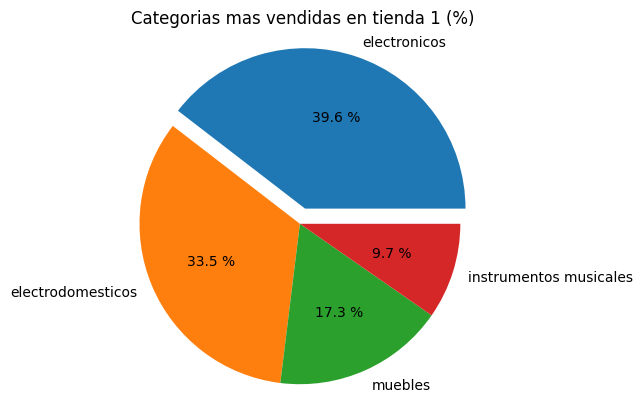

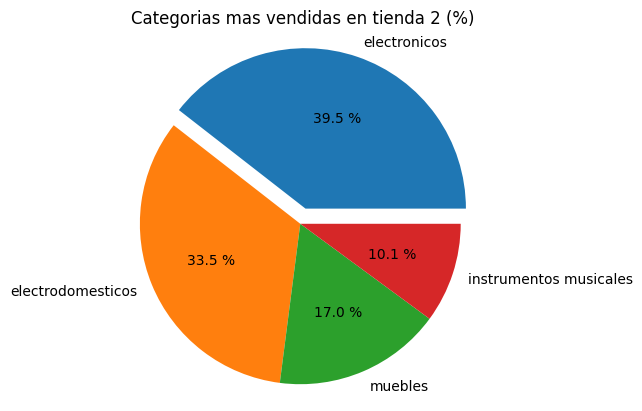

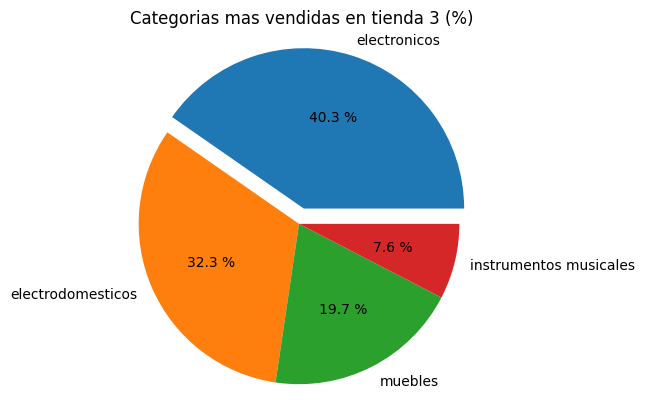

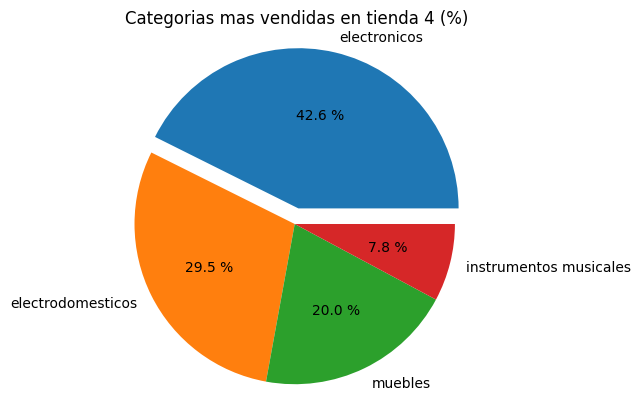

In [ ]:
def graficos_torta(ventas, titulo_tienda):
    categorias = ["electronicos", "electrodomesticos", "muebles", "instrumentos musicales"]
    desfase = (0.1, 0, 0, 0)
    plt.pie(ventas, labels=categorias, autopct="%0.1f %%", explode=desfase)
    plt.axis("equal")
    plt.title(f"Categorias mas vendidas en {titulo_tienda} (%)")
    plt.show()


ventas1 = [429493500, 363685200, 187633700, 104990300]
ventas2 = [410831100, 348567800, 176426300, 104990300]
ventas3 = [410775800, 329237900, 201072100, 77380900]
ventas4 = [409476100, 283260200, 192528900, 75102400]


graficos_torta(ventas1, "tienda 1")
graficos_torta(ventas2, "tienda 2")
graficos_torta(ventas3, "tienda 3")
graficos_torta(ventas4, "tienda 4")

# 3. Calificación promedio de la tienda


In [ ]:
def promedio_calificacion (tienda, Calificacion,i):
   calificacion_promedio_tienda = round(statistics.mean(tienda["Calificación"]),2)
   print(f'la calificacion promedio de la tienda {i} es: {calificacion_promedio_tienda}')
promedio_calificacion(tienda, "Calificación",1)
promedio_calificacion(tienda2, "Calificación",2)
promedio_calificacion(tienda3, "Calificación",3)
promedio_calificacion(tienda4, "Calificación",4)
calificaciones = tienda["Calificación"]


la calificacion promedio de la tienda 1 es: 3.98
la calificacion promedio de la tienda 2 es: 4.04
la calificacion promedio de la tienda 3 es: 4.05
la calificacion promedio de la tienda 4 es: 4.0


# **GRAFICO CALIFICACIONES PROMEDIO**

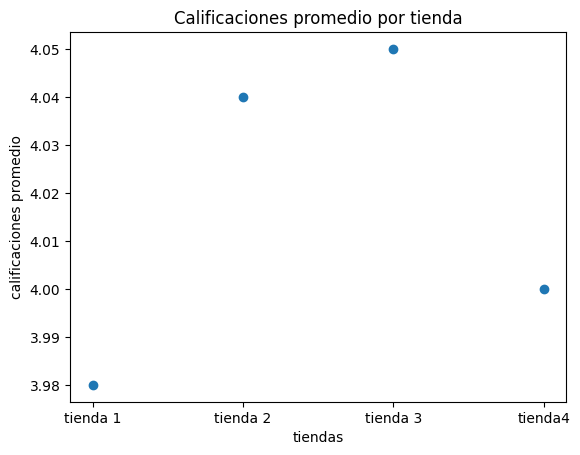

In [ ]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots()
x = ['tienda 1','tienda 2','tienda 3','tienda4']
y = [ 3.98, 4.04, 4.05, 4.0 ]
plt.title('Calificaciones promedio por tienda', loc = 'center')
ax.set_xlabel('tiendas')
ax.set_ylabel('calificaciones promedio')
plt.scatter(x,y )
plt.show()


# 4. Productos más y menos vendidos

In [ ]:
import operator
def productos_mas_y_menos_vendidos (tienda, Producto,i):
  columna_Producto = tienda["Producto"]
  lista_Producto = list(columna_Producto)
  lista_Producto_unico = list(set(columna_Producto))

# print(lista_Producto_unico)


  lista_de_listas = []
  for Producto in lista_Producto_unico:
    lista = [prod for prod in lista_Producto if prod == Producto]
    lista_de_listas.append(lista)
# print(lista_de_listas)


  conteo_productos = {lista_Producto_unico[i]: len(lista_de_listas[i]) for i in range(len(lista_Producto_unico))}
  # print(conteo_productos)
  print('')
  conteo_productos_ordenado_descendente = dict(sorted(conteo_productos.items(), key=lambda item: item[1], reverse= True ))
  print(f'los productos mas vendidos en la tienda {i} son: \n{conteo_productos_ordenado_descendente}')
  # print('')
  conteo_productos_ordenado_ascendente = dict(sorted(conteo_productos.items(), key=lambda item: item[1], reverse= False ))
  print(f'los productos menos vendidos en la tienda {i} son: \n{conteo_productos_ordenado_ascendente}')
productos_mas_y_menos_vendidos(tienda,"Producto",1)
productos_mas_y_menos_vendidos(tienda2,"Producto",2)
productos_mas_y_menos_vendidos(tienda3,"Producto",3)
productos_mas_y_menos_vendidos(tienda4,"Producto",4)




los productos mas vendidos en la tienda 1 son: 
{'TV LED UHD 4K': 60, 'Armario': 60, 'Microondas': 60, 'Secadora de ropa': 58, 'Mesa de noche': 56, 'Bloques de construcción': 56, 'Balón de baloncesto': 55, 'Refrigerador': 54, 'Vaso térmico': 54, 'Impresora': 54, 'Bicicleta': 54, 'Batería': 53, 'Cubertería': 52, 'Carrito de control remoto': 52, 'Modelado predictivo': 51, 'Auriculares': 50, 'Iphone 15': 49, 'Ajedrez de madera': 49, 'Lavavajillas': 48, 'Lavadora de ropa': 47, 'Guitarra eléctrica': 47, 'Guitarra acústica': 46, 'Silla de oficina': 46, 'Sofá reclinable': 46, 'Estufa': 45, 'Mesa de centro': 44, 'Cama king': 44, 'Cubo mágico 8x8': 44, 'Smart TV': 44, 'Cama box': 44, 'Kit de bancas': 44, 'Juego de mesa': 43, 'Set de ollas': 43, 'Smartwatch': 43, 'Tablet ABXY': 42, 'Balón de voleibol': 42, 'Dashboards con Power BI': 42, 'Set de vasos': 41, 'Iniciando en programación': 41, 'Sillón': 41, 'Asistente virtual': 40, 'Muñeca bebé': 40, 'Dinosaurio Rex': 40, 'Mesa de comedor': 40, 'Cue

# 5. Valor del envio promedio por tienda

In [ ]:
def promedio_costo_envio (tienda,Costo,i):

   costo_de_envio = sum(tienda["Costo de envío"])

   promedio = round(statistics.mean(tienda["Costo de envío"]),2)
   print(f'el costo de envio promedio de la tienda {i} es:  $ {promedio:,.0f} y el costo total de envio es:  $ {costo_de_envio:,.0f}')

promedio_costo_envio(tienda,"Costo de envío",1)
promedio_costo_envio(tienda2,"Costo de envío",2)
promedio_costo_envio(tienda3,"Costo de envío",3)
promedio_costo_envio(tienda4,"Costo de envío",4)
# pcv1 = promedio_costo_envio(tienda,"Costo de envío",1)
# pcv2 = promedio_costo_envio(tienda2,"Costo de envío",2)
# pcv3 = promedio_costo_envio(tienda3,"Costo de envío",3)
# pcv4 = promedio_costo_envio(tienda4,"Costo de envío",4)

el costo de envio promedio de la tienda 1 es:  $ 26,019 y el costo total de envio es:  $ 61,377,900
el costo de envio promedio de la tienda 2 es:  $ 25,216 y el costo total de envio es:  $ 59,485,100
el costo de envio promedio de la tienda 3 es:  $ 24,806 y el costo total de envio es:  $ 58,516,600
el costo de envio promedio de la tienda 4 es:  $ 23,459 y el costo total de envio es:  $ 55,317,400


El porcentaje del costo total de envio del total de facturacion de la tienda 1 es 5,33 %, de la tienda 2 es 5,32 %, de la tienda 3 es 5,32 % y de la tienda 4 es 5,32 %.

# **Grafico costo de envio promedio por tienda**

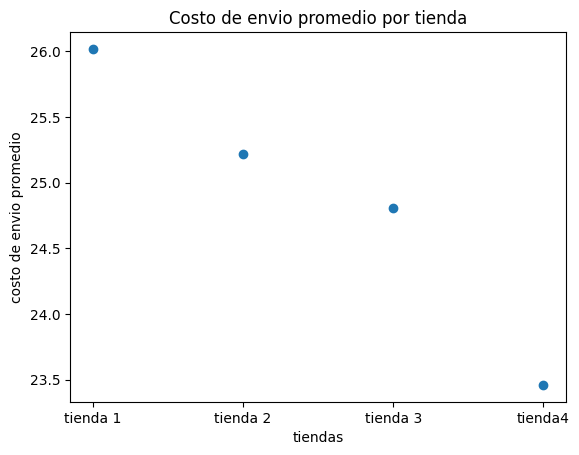

In [ ]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots()
x = ['tienda 1','tienda 2','tienda 3','tienda4']
y = [26.019 ,25.216 ,24.806 ,23.459  ]
plt.title('Costo de envio promedio por tienda', loc = 'center')
ax.set_xlabel('tiendas')
ax.set_ylabel('costo de envio promedio')
plt.scatter(x,y)
plt.show()

#6. Analisis de desempeno geografico

In [ ]:
import operator
def lugares_de_mayores_compras (tienda, lugar_de_compra,i):

  columna_lugar_de_compra = tienda["Lugar de Compra"]
  lista_lugar_de_compra = list(columna_lugar_de_compra)
  lista_lugar_de_compra_unico = list(set(columna_lugar_de_compra))

# print(lista_Producto_unico)
  lista_de_listas = []
  for lugar in lista_lugar_de_compra_unico:
    lista = [lug for lug in lista_lugar_de_compra if lug == lugar]
    lista_de_listas.append(lista)
# print(lista_de_listas)

  conteo_lugar_de_compra = {lista_lugar_de_compra_unico[i]: len(lista_de_listas[i]) for i in range(len(lista_lugar_de_compra_unico))}
# print(conteo_lugar_de_compra)

  columna_lat = tienda["lat"]
  lista_lat = list(columna_lat)

  columna_lon = tienda["lon"]
  lista_lon = list(columna_lon)
  print('')
  lugar_de_compra_lat_lon = {lista_lugar_de_compra[i]: (lista_lat[i], lista_lon[i]) for i in range(len(lista_lat))}
  print(f'Coordenadas lugar de compra de la tienda {i} {lugar_de_compra_lat_lon}')

  conteo_lugar_de_compra_descendente = dict(sorted(conteo_lugar_de_compra.items(), key=lambda item: item[1], reverse= True ))

  print(f'Los lugares de mayores compras de la tienda {i} son: \n{conteo_lugar_de_compra_descendente}')


lugares_de_mayores_compras(tienda,"Lugar de Compra	",1)
lugares_de_mayores_compras(tienda2,"Lugar de Compra	",2)
lugares_de_mayores_compras(tienda3,"Lugar de Compra	",3)
lugares_de_mayores_compras(tienda4,"Lugar de Compra	",4)




Coordenadas lugar de compra de la tienda 1 {'Bogotá': (4.60971, -74.08175), 'Medellín': (6.25184, -75.56359), 'Cartagena': (10.39972, -75.51444), 'Cali': (3.43722, -76.5225), 'Santa Marta': (11.24079, -74.19904), 'Pereira': (4.81333, -75.69611), 'Barranquilla': (10.96854, -74.78132), 'Villavicencio': (4.142, -73.62664), 'Inírida': (3.8653, -67.9239), 'Cúcuta': (7.89391, -72.50782), 'Manizales': (5.06889, -75.51738), 'Neiva': (2.9273, -75.28189), 'Bucaramanga': (7.12539, -73.1198), 'Valledupar': (10.46314, -73.25322), 'Pasto': (1.21361, -77.28111), 'Riohacha': (11.54444, -72.90722), 'Armenia': (4.53389, -75.68111), 'Leticia': (-4.21528, -69.94056), 'Soacha': (4.57937, -74.21682)}
Los lugares de mayores compras de la tienda 1 son: 
{'Bogotá': 984, 'Medellín': 563, 'Cali': 283, 'Pereira': 133, 'Barranquilla': 75, 'Cartagena': 53, 'Cúcuta': 51, 'Riohacha': 40, 'Leticia': 32, 'Santa Marta': 32, 'Bucaramanga': 31, 'Pasto': 23, 'Manizales': 15, 'Armenia': 14, 'Villavicencio': 11, 'Neiva': 6,

# **Analisis del desempeno geografico**

Las mayores ventas se producen en bogota, medellin y cali con un 77,57 % de las ventas totales en la tienda 1, 76,34% en la tienda 2, 76,76 % en la tienda 3 y 77,23 % en la tienda 4.

# **GRAFICO COORDENADAS**

In [ ]:
from os import path
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import folium

from shapely.geometry import Point
m = folium.Map(location=[tienda['lat'].mean(), tienda['lon'].mean()], zoom_start=5)

for index, row in tienda.iterrows():
    folium.Marker(location=[row['lat'], row['lon']], popup=f"Lat: {row['lat']}, Lon: {row['lon']}").add_to(m)
m




In [ ]:
from os import path
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import folium

from shapely.geometry import Point


# Crear un mapa base
m = folium.Map(location=[tienda2['lat'].mean(), tienda2['lon'].mean()], zoom_start=5) # Using df instead of tienda which may not have lat/lon
# Añadir marcadores al mapa
for index, row in tienda2.iterrows(): # Using df instead of tienda which may not have lat/lon
    popup_text = f"Lat: {row['lat']}, Lon: {row['lon']}"
    folium.Marker(location=[row['lat'], row['lon']], popup=popup_text).add_to(m)
# Mostrar el mapa
m

In [ ]:
from os import path
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import folium

from shapely.geometry import Point
m = folium.Map(location=[tienda3['lat'].mean(), tienda3['lon'].mean()], zoom_start=5)

for index, row in tienda3.iterrows():
    folium.Marker(location=[row['lat'], row['lon']], popup=f"Lat: {row['lat']}, Lon: {row['lon']}").add_to(m)
m

In [ ]:
from os import path
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import folium

from shapely.geometry import Point



m = folium.Map(location=[tienda4['lat'].mean(), tienda4['lon'].mean()], zoom_start=5)

for index, row in tienda4.iterrows():
    popup_text = f"Lat: {row['lat']}, Lon: {row['lon']}"
    folium.Marker(location=[row['lat'], row['lon']], popup=popup_text).add_to(m)
m

# **Analisis Alura Store**

Si bien la tienda 1 es la que mas facturacion tiene, tambien es la que tiene la peor calificacion promedio de la tienda y el mayor porcentaje de costo de envio respecto de la facturacion por lo que no podriamos calificarla como la mejor tienda.

Por otra parte la tienda 4 es la que menor facturacion tiene, la tercera mejor calificacion de tienda y mejor porcentaje de costos de envio respecto de la facturacion que la tienda 1 por lo que a mi criterio no podriamos calificarla como la peor tienda.

Al analizar las ventas por ciudades nos damos cuenta que estas se concentran en las ciudades de bogota, medellin y cali en las 4 tiendas, con porcentajes respecto a las ventas totales que varian entre un 76,34% en la tienda 2 y un 77,57% en la tienda 1.

Por lo que podemos ver, las 4 tiendas tienen numeros muy similares en todas las categorias evaluadas y se hace muy dificil escoger una tienda a eliminar.

Yo aconsejo no eliminar ninguna tienda y reorganizar la empresa estableciendo 4 sucursales en distintos lugares del pais, que se repartan la distribucion de los productos por sector geografico y asi no tener que vender cada tienda a todo el pais. eso disminuiria los costos de envio, mejoraria los tiempos de entrega y la percepcion de la empresa por parte del cliente mejorando la calificacion de la tienda.